In [1]:
import dataclasses
import os
import matplotlib.pyplot as plt
import numpy as np
import jax.numpy as jnp
import jax.random as jr
import wandb
import warnings

from datetime import datetime
from sklearn.model_selection import KFold
from fastprogress import progress_bar
import sys
# Add parent directory to system path
sys.path.append(r"C:\Users\stuberadmin\fos")

from fos import seminmf_counts_2 as seminmf

warnings.filterwarnings("ignore")

In [2]:
# set up paths
rootpath = r"\\10.159.50.7\LabCommon\Ken\data\Opioid_cFos"
result_dir = os.path.join(rootpath, "spatial_clustering_results")

In [3]:
WANDB_PROJECT = "morphine-fos-seminmf-counts"
RESULTS_DIR = os.path.join(result_dir,datetime.now().strftime("%Y_%m_%d-%H_%M"))

if not os.path.exists(RESULTS_DIR):
    os.mkdir(RESULTS_DIR)

## Combine all the per-mouse arrays into one file

In [4]:
# DATA_DIREC = "/scratch/groups/swl1/serotonin/npz_4"

# N = len(os.listdir(DATA_DIREC))
# height = 89
# width = 95
# depth = 80
# intensity_3d = np.zeros((N, height, width, depth), dtype=np.float32)
# counts_3d = np.zeros((N, height, width, depth), dtype=np.int16)
# inds = -1 * np.ones(N)

# for i, fname in enumerate(os.listdir(DATA_DIREC)):
#     # print(fname)
#     ind = int(fname[:3])
#     inds[i] = ind

#     npz = np.load(os.path.join(DATA_DIREC, fname))
#     coords = npz["coords"]
#     x, y, z = coords.T
#     intensity_3d[i][x, y, z] = npz["log_vs"]
#     counts_3d[i][x, y, z] = npz["Ns"]
    
# np.savez(os.path.join(DATA_DIREC, f"downsampled_data_4.npz"),
#          intensity=intensity_3d, counts=counts_3d, mouse_inds=inds)

## Load the combined data

In [5]:
!ls -lh /scratch/groups/swl1/serotonin/npz_4/downsampled_data_4.npz

ls: cannot access '/scratch/groups/swl1/serotonin/npz_4/downsampled_data_4.npz': No such file or directory


In [6]:
# load the atlas image
import tifffile
# read an annotated atlas file
atlas_img = tifffile.imread(r"\\10.159.50.7\Analysis2\Ken\LSMS\ClearMap\clearmap_ressources_mouse_brain\ClearMap_ressources\Regions_annotations\Kim_ref_adult_FP-label_v4.0.tif")
contour_img = tifffile.imread(r"\\10.159.50.7\Analysis2\Ken\ClearMap\clearmap_ressources_mouse_brain\ClearMap_ressources\Regions_annotations\Kim_ref_adult_FP-label_v2.9_contour_map.tif")


In [7]:
# load the meta information
import pandas as pd
metadf = pd.read_csv(r"\\10.159.50.7\LabCommon\Ken\data\Opioid_cFos\meta\OP_meta.csv")
# Use only morphine related groups
Conditions = ['Saline','Acute_Morphine','Chronic_Morphine','Withdrawal_Morphine','Chronic_Morphine_21','Withdrawal_Morphine_21',]
print(Conditions)

# subset the meta dataframe
metadf = metadf[metadf.Condition.isin(Conditions)]

['Saline', 'Acute_Morphine', 'Chronic_Morphine', 'Withdrawal_Morphine', 'Chronic_Morphine_21', 'Withdrawal_Morphine_21']


In [8]:
import dask.array as da
analysis_resultpath = r"\\10.159.50.7\LabCommon\Ken\data\Opioid_cFos"
# load the dask array storing the heatmap
DATA_FILE = os.path.join(r"\\10.159.50.7\LabCommon\Ken\data\Opioid_cFos",'heatmap_array')
# read the adjusted heatmap
#DATA_FILE = os.path.join(r"\\10.159.50.7\LabCommon\Ken\data\Opioid_cFos\result",'adjusted_brain_heatmap.zarr')
counts = da.from_zarr(DATA_FILE, mode="r")
# load the fnames   
fnamelist = np.load(os.path.join(analysis_resultpath,'fnamelist.npy'))
assert len(fnamelist) == counts.shape[0]
#print(fnamelist)

In [9]:
# reorder the meta data frame
metadf = metadf.set_index('fname').loc[fnamelist].reset_index()

In [10]:
# intensity_3d = data["intensity"] remove
counts_3d = counts.reshape([counts.shape[0],] + list(atlas_img.shape)).compute() # reshape to atlas shape
mouse_inds = metadf.index


In [11]:
assert counts_3d.shape[0] == 43

In [12]:
# the condition information will be located from the metadf 
drugs = metadf.Condition.values

### Remove the left edge to address edge effects

In [13]:
'''LEFT_TRUNC = 8
counts_3d = counts_3d[:, LEFT_TRUNC:, :, :]
intensity_3d = intensity_3d[:, LEFT_TRUNC:, :, :]
counts_3d.shape'''

'LEFT_TRUNC = 8\ncounts_3d = counts_3d[:, LEFT_TRUNC:, :, :]\nintensity_3d = intensity_3d[:, LEFT_TRUNC:, :, :]\ncounts_3d.shape'

### down sample data

In [18]:

import numpy as np
from skimage.transform import resize
from scipy.ndimage import median_filter

ds_key = True
input_voxel_size = (20,20,50)
target_voxel_size = (50,50,50)
if ds_key:
        
    # the original data is in 20,20,50 um voxel
    # this can be downsampled to THE TARGET VOXEL SIZE
    # these are in x,y,z order

    input_voxel_shape = atlas_img.shape
    target_voxel_shape = tuple(np.array(np.array(input_voxel_shape) * np.array(input_voxel_size)[::-1] / np.array(target_voxel_size)[::-1],dtype = 'int'))
    print(target_voxel_shape)

    # Resize with interpolation (anti_aliasing helps for float input)
    atlas_img_resized = resize(
        atlas_img,
        output_shape=target_voxel_shape,
        order=0,  # 1=linear interpolation (faster), 3=cubic
        mode='reflect',
        anti_aliasing=True
    )

    # Resize with interpolation (anti_aliasing helps for float input)
    contour_img_resized = resize(
        contour_img,
        output_shape=target_voxel_shape,
        order=1,  # 1=linear interpolation (faster), 3=cubic
        mode='reflect',
        anti_aliasing=False
    )

    # apply the resize to the counts_3d
    # the counts_3d is a 4D array with shape (n_samples, height, width, depth)
    counts_3d_resized = np.array([resize(
        f,
        output_shape=target_voxel_shape,
        order=0,  # 1=linear interpolation (faster), 3=cubic
        mode='reflect',
        anti_aliasing=False
    ) for f in counts_3d])

    # swap the variables
    counts_3d = counts_3d_resized.astype(np.int16)
    atlas_img = atlas_img_resized.astype(np.int16)


(300, 180, 260)


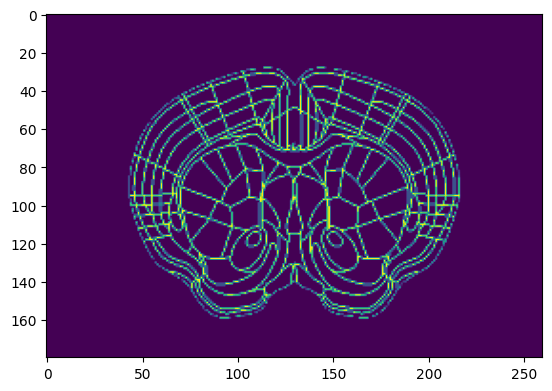

In [19]:
plt.imshow(contour_img_resized[105,:,:])

### Only work with live voxels

In [20]:
#brain_voxels = atlas_img > 0
#counts_3d = counts_3d[:,brain_voxels]

In [21]:
alive_voxels = np.sum(counts_3d,axis =0)!=0
print(np.sum(alive_voxels), "/", np.prod(counts_3d.shape[1:]), "voxels are 'alive'")

3902991 / 14040000 voxels are 'alive'


In [22]:
#intensity = intensity_3d[:, alive_voxels]
counts = counts_3d[:, alive_voxels]
#intensity[counts == 0] = 0.0

(<Axes: >, <matplotlib.image.AxesImage at 0x1ca6038ccb0>)

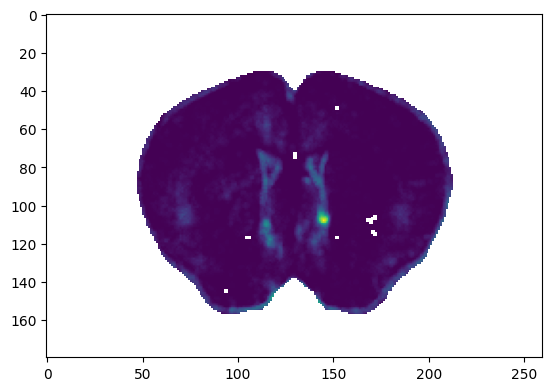

In [24]:
def plot_coronal(flat_array, z_idx, ax=None): # edit this so it works with my counts data, images are converted in to coronal planes already
    arr = jnp.nan * jnp.zeros(alive_voxels.shape)
    arr = arr.at[alive_voxels].set(flat_array)

    if ax is None:
        fig, ax = plt.subplots(1, 1)
    im = ax.imshow(arr[z_idx, :, :])
    return ax, im

#vis_intensity = jnp.where(counts == 0, jnp.nan, 0)

#plot_coronal(vis_intensity[0], 105)

plot_coronal(counts[8], 100)

### Make random masks

Mask off hyperrectangles for each mouse.

In [25]:
# def make_masks(key, size, num_rect_per_mouse=3):
MASK_KEY = 0
MASK_SIZE = 10
NUM_MASKS_PER_MOUSE = 3

key = jr.PRNGKey(MASK_KEY)
M, H, W, D = counts_3d.shape
masks_3d = jnp.ones_like(counts_3d, dtype=bool)

for m in progress_bar(range(M)):
    for i in range(NUM_MASKS_PER_MOUSE):
        k1, k2, k3, key = jr.split(key, 4)
        x,y,z = jr.randint(k1, (3,), minval=jnp.zeros(3), maxval=jnp.array([H, W, D]))
        masks_3d = masks_3d.at[m, x:x+MASK_SIZE, y:y+MASK_SIZE, z:z+MASK_SIZE].set(False)

masks = masks_3d[:, alive_voxels]


(<Axes: >, <matplotlib.image.AxesImage at 0x1ca602c2b40>)

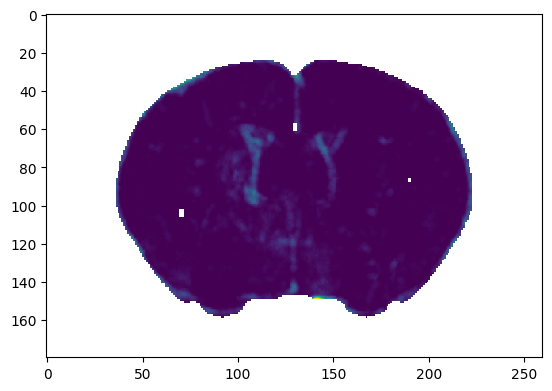

In [26]:
plot_coronal(jnp.where(masks[0], counts[0], jnp.nan), 120)

## Select hyperparameters by cross validation

In [27]:
from importlib import reload
reload(seminmf)

<module 'fos.seminmf_counts_2' from 'C:\\Users\\stuberadmin\\fos\\fos\\seminmf_counts_2.py'>

In [28]:
mean_func = "softplus"
elastic_net_frac = 1.0
num_iters = 500
num_coord_ascent_iters = 1

# Compute the SVD initialization once
max_num_factors = 24
full_initial_params = seminmf.initialize_nnsvd(counts, max_num_factors, mean_func, drugs=None)

# Fit the model
all_sparsity_penalties = jnp.array([1e-4, 1e-3, 1e-2, 1e-1, 1e0])
all_num_factors = jnp.arange(8, max_num_factors+1, 2)
# all_sparsity_penalties = jnp.array([1e-2])
# all_num_factors = jnp.array([18])
all_heldout_loglikes = -jnp.inf * jnp.ones((len(all_sparsity_penalties), len(all_num_factors)))

for i, sparsity_penalty in enumerate(all_sparsity_penalties):
    sparsity_penalty = sparsity_penalty.item()
    for j, num_factors in enumerate(all_num_factors):
        wandb.init(
            # set the wandb project where this run will be logged
            project=WANDB_PROJECT,
            job_type="train",

            # track hyperparameters and run metadata
            config={
                "sparsity_penalty": sparsity_penalty,
                "num_factors": num_factors,
                "elastic_net_frac": elastic_net_frac,
                "max_num_iters": num_iters,
                "num_coord_ascent_iters": num_coord_ascent_iters,
                "mean_func": mean_func,
                "initialization": "nnsvd",
                "data_file": DATA_FILE,
                "mask_key": MASK_KEY,
                "mask_size": MASK_SIZE,
                "num_mask_per_mouse": NUM_MASKS_PER_MOUSE,
                }
        )
        
        print("fitting model with", sparsity_penalty, "sparsity and ", num_factors, "factors")
        initial_params = dataclasses.replace(
            full_initial_params,
            factors=full_initial_params.factors[:num_factors],
            count_loadings=full_initial_params.count_loadings[:, :num_factors],
        )

        params, losses, heldout_loglikes = \
            seminmf.fit_poisson_seminmf(counts,
                                initial_params,
                                mask=masks,
                                mean_func=mean_func,
                                sparsity_penalty=sparsity_penalty,
                                elastic_net_frac=elastic_net_frac,
                                num_iters=num_iters,
                                num_coord_ascent_iters=num_coord_ascent_iters,
                                tolerance=1e-5
                                )

        all_heldout_loglikes = all_heldout_loglikes.at[i, j].set(heldout_loglikes[-1])
        
        # Log results to wandb
        wandb.run.summary["final_loss"] = losses[-1]
        wandb.run.summary["heldout_loglike"] = heldout_loglikes[-1]
        wandb.finish()


wandb: Using wandb-core as the SDK backend.  Please refer to https://wandb.me/wandb-core for more information.
wandb: Currently logged in as: ken1223 (ken1223-university-of-washington). Use `wandb login --relogin` to force relogin


fitting model with 9.999999747378752e-05 sparsity and  8 factors
Shapes:
counts: (43, 3902991)
factors: (8, 3902991)
count_loadings: (43, 8)
count_row_effects: (43,)
count_col_effects: (3902991,)
counts dtype: int16
sparsity_penalty type: <class 'float'>
elastic_net_frac type: <class 'float'>


final_loss,2.87162
heldout_loglike,-0.00086


fitting model with 9.999999747378752e-05 sparsity and  10 factors
Shapes:
counts: (43, 3902991)
factors: (10, 3902991)
count_loadings: (43, 10)
count_row_effects: (43,)
count_col_effects: (3902991,)
counts dtype: int16
sparsity_penalty type: <class 'float'>
elastic_net_frac type: <class 'float'>


final_loss,2.71293
heldout_loglike,-0.00075


fitting model with 9.999999747378752e-05 sparsity and  12 factors
Shapes:
counts: (43, 3902991)
factors: (12, 3902991)
count_loadings: (43, 12)
count_row_effects: (43,)
count_col_effects: (3902991,)
counts dtype: int16
sparsity_penalty type: <class 'float'>
elastic_net_frac type: <class 'float'>


final_loss,2.60447
heldout_loglike,-0.00065


fitting model with 9.999999747378752e-05 sparsity and  14 factors
Shapes:
counts: (43, 3902991)
factors: (14, 3902991)
count_loadings: (43, 14)
count_row_effects: (43,)
count_col_effects: (3902991,)
counts dtype: int16
sparsity_penalty type: <class 'float'>
elastic_net_frac type: <class 'float'>


final_loss,2.52964
heldout_loglike,-0.00066


fitting model with 9.999999747378752e-05 sparsity and  16 factors
Shapes:
counts: (43, 3902991)
factors: (16, 3902991)
count_loadings: (43, 16)
count_row_effects: (43,)
count_col_effects: (3902991,)
counts dtype: int16
sparsity_penalty type: <class 'float'>
elastic_net_frac type: <class 'float'>


final_loss,2.32445
heldout_loglike,-0.00083


fitting model with 9.999999747378752e-05 sparsity and  18 factors
Shapes:
counts: (43, 3902991)
factors: (18, 3902991)
count_loadings: (43, 18)
count_row_effects: (43,)
count_col_effects: (3902991,)
counts dtype: int16
sparsity_penalty type: <class 'float'>
elastic_net_frac type: <class 'float'>


final_loss,2.22908
heldout_loglike,-0.00075


fitting model with 9.999999747378752e-05 sparsity and  20 factors
Shapes:
counts: (43, 3902991)
factors: (20, 3902991)
count_loadings: (43, 20)
count_row_effects: (43,)
count_col_effects: (3902991,)
counts dtype: int16
sparsity_penalty type: <class 'float'>
elastic_net_frac type: <class 'float'>


final_loss,2.13256
heldout_loglike,-0.00065


fitting model with 9.999999747378752e-05 sparsity and  22 factors
Shapes:
counts: (43, 3902991)
factors: (22, 3902991)
count_loadings: (43, 22)
count_row_effects: (43,)
count_col_effects: (3902991,)
counts dtype: int16
sparsity_penalty type: <class 'float'>
elastic_net_frac type: <class 'float'>


final_loss,2.09147
heldout_loglike,-0.0006


fitting model with 9.999999747378752e-05 sparsity and  24 factors
Shapes:
counts: (43, 3902991)
factors: (24, 3902991)
count_loadings: (43, 24)
count_row_effects: (43,)
count_col_effects: (3902991,)
counts dtype: int16
sparsity_penalty type: <class 'float'>
elastic_net_frac type: <class 'float'>


final_loss,1.99822
heldout_loglike,-0.00063


fitting model with 0.0010000000474974513 sparsity and  8 factors
Shapes:
counts: (43, 3902991)
factors: (8, 3902991)
count_loadings: (43, 8)
count_row_effects: (43,)
count_col_effects: (3902991,)
counts dtype: int16
sparsity_penalty type: <class 'float'>
elastic_net_frac type: <class 'float'>


final_loss,2.8964
heldout_loglike,-0.00086


fitting model with 0.0010000000474974513 sparsity and  10 factors
Shapes:
counts: (43, 3902991)
factors: (10, 3902991)
count_loadings: (43, 10)
count_row_effects: (43,)
count_col_effects: (3902991,)
counts dtype: int16
sparsity_penalty type: <class 'float'>
elastic_net_frac type: <class 'float'>


final_loss,2.70981
heldout_loglike,-0.00076


fitting model with 0.0010000000474974513 sparsity and  12 factors
Shapes:
counts: (43, 3902991)
factors: (12, 3902991)
count_loadings: (43, 12)
count_row_effects: (43,)
count_col_effects: (3902991,)
counts dtype: int16
sparsity_penalty type: <class 'float'>
elastic_net_frac type: <class 'float'>


final_loss,2.60176
heldout_loglike,-0.00066


fitting model with 0.0010000000474974513 sparsity and  14 factors
Shapes:
counts: (43, 3902991)
factors: (14, 3902991)
count_loadings: (43, 14)
count_row_effects: (43,)
count_col_effects: (3902991,)
counts dtype: int16
sparsity_penalty type: <class 'float'>
elastic_net_frac type: <class 'float'>


final_loss,2.4785
heldout_loglike,-0.00068


fitting model with 0.0010000000474974513 sparsity and  16 factors
Shapes:
counts: (43, 3902991)
factors: (16, 3902991)
count_loadings: (43, 16)
count_row_effects: (43,)
count_col_effects: (3902991,)
counts dtype: int16
sparsity_penalty type: <class 'float'>
elastic_net_frac type: <class 'float'>


final_loss,2.36498
heldout_loglike,-0.00074


fitting model with 0.0010000000474974513 sparsity and  18 factors
Shapes:
counts: (43, 3902991)
factors: (18, 3902991)
count_loadings: (43, 18)
count_row_effects: (43,)
count_col_effects: (3902991,)
counts dtype: int16
sparsity_penalty type: <class 'float'>
elastic_net_frac type: <class 'float'>


final_loss,2.24354
heldout_loglike,-0.00072


fitting model with 0.0010000000474974513 sparsity and  20 factors
Shapes:
counts: (43, 3902991)
factors: (20, 3902991)
count_loadings: (43, 20)
count_row_effects: (43,)
count_col_effects: (3902991,)
counts dtype: int16
sparsity_penalty type: <class 'float'>
elastic_net_frac type: <class 'float'>


final_loss,2.21607
heldout_loglike,-0.00067


fitting model with 0.0010000000474974513 sparsity and  22 factors
Shapes:
counts: (43, 3902991)
factors: (22, 3902991)
count_loadings: (43, 22)
count_row_effects: (43,)
count_col_effects: (3902991,)
counts dtype: int16
sparsity_penalty type: <class 'float'>
elastic_net_frac type: <class 'float'>


final_loss,2.03789
heldout_loglike,-0.00063


fitting model with 0.0010000000474974513 sparsity and  24 factors
Shapes:
counts: (43, 3902991)
factors: (24, 3902991)
count_loadings: (43, 24)
count_row_effects: (43,)
count_col_effects: (3902991,)
counts dtype: int16
sparsity_penalty type: <class 'float'>
elastic_net_frac type: <class 'float'>


final_loss,1.92034
heldout_loglike,-0.00068


fitting model with 0.009999999776482582 sparsity and  8 factors
Shapes:
counts: (43, 3902991)
factors: (8, 3902991)
count_loadings: (43, 8)
count_row_effects: (43,)
count_col_effects: (3902991,)
counts dtype: int16
sparsity_penalty type: <class 'float'>
elastic_net_frac type: <class 'float'>


final_loss,2.97927
heldout_loglike,-0.00089


fitting model with 0.009999999776482582 sparsity and  10 factors
Shapes:
counts: (43, 3902991)
factors: (10, 3902991)
count_loadings: (43, 10)
count_row_effects: (43,)
count_col_effects: (3902991,)
counts dtype: int16
sparsity_penalty type: <class 'float'>
elastic_net_frac type: <class 'float'>


final_loss,2.80071
heldout_loglike,-0.00074


fitting model with 0.009999999776482582 sparsity and  12 factors
Shapes:
counts: (43, 3902991)
factors: (12, 3902991)
count_loadings: (43, 12)
count_row_effects: (43,)
count_col_effects: (3902991,)
counts dtype: int16
sparsity_penalty type: <class 'float'>
elastic_net_frac type: <class 'float'>


final_loss,2.71378
heldout_loglike,-0.00062


fitting model with 0.009999999776482582 sparsity and  14 factors
Shapes:
counts: (43, 3902991)
factors: (14, 3902991)
count_loadings: (43, 14)
count_row_effects: (43,)
count_col_effects: (3902991,)
counts dtype: int16
sparsity_penalty type: <class 'float'>
elastic_net_frac type: <class 'float'>


final_loss,2.59038
heldout_loglike,-0.00064


fitting model with 0.009999999776482582 sparsity and  16 factors
Shapes:
counts: (43, 3902991)
factors: (16, 3902991)
count_loadings: (43, 16)
count_row_effects: (43,)
count_col_effects: (3902991,)
counts dtype: int16
sparsity_penalty type: <class 'float'>
elastic_net_frac type: <class 'float'>


final_loss,2.42655
heldout_loglike,-0.00079


fitting model with 0.009999999776482582 sparsity and  18 factors
Shapes:
counts: (43, 3902991)
factors: (18, 3902991)
count_loadings: (43, 18)
count_row_effects: (43,)
count_col_effects: (3902991,)
counts dtype: int16
sparsity_penalty type: <class 'float'>
elastic_net_frac type: <class 'float'>


final_loss,2.34729
heldout_loglike,-0.00081


fitting model with 0.009999999776482582 sparsity and  20 factors
Shapes:
counts: (43, 3902991)
factors: (20, 3902991)
count_loadings: (43, 20)
count_row_effects: (43,)
count_col_effects: (3902991,)
counts dtype: int16
sparsity_penalty type: <class 'float'>
elastic_net_frac type: <class 'float'>


final_loss,2.24619
heldout_loglike,-0.00067


fitting model with 0.009999999776482582 sparsity and  22 factors
Shapes:
counts: (43, 3902991)
factors: (22, 3902991)
count_loadings: (43, 22)
count_row_effects: (43,)
count_col_effects: (3902991,)
counts dtype: int16
sparsity_penalty type: <class 'float'>
elastic_net_frac type: <class 'float'>


final_loss,2.19906
heldout_loglike,-0.0006


fitting model with 0.009999999776482582 sparsity and  24 factors
Shapes:
counts: (43, 3902991)
factors: (24, 3902991)
count_loadings: (43, 24)
count_row_effects: (43,)
count_col_effects: (3902991,)
counts dtype: int16
sparsity_penalty type: <class 'float'>
elastic_net_frac type: <class 'float'>


final_loss,2.11924
heldout_loglike,-0.00066


fitting model with 0.10000000149011612 sparsity and  8 factors
Shapes:
counts: (43, 3902991)
factors: (8, 3902991)
count_loadings: (43, 8)
count_row_effects: (43,)
count_col_effects: (3902991,)
counts dtype: int16
sparsity_penalty type: <class 'float'>
elastic_net_frac type: <class 'float'>


final_loss,3.31413
heldout_loglike,-0.00087


fitting model with 0.10000000149011612 sparsity and  10 factors
Shapes:
counts: (43, 3902991)
factors: (10, 3902991)
count_loadings: (43, 10)
count_row_effects: (43,)
count_col_effects: (3902991,)
counts dtype: int16
sparsity_penalty type: <class 'float'>
elastic_net_frac type: <class 'float'>


final_loss,3.21003
heldout_loglike,-0.00087


fitting model with 0.10000000149011612 sparsity and  12 factors
Shapes:
counts: (43, 3902991)
factors: (12, 3902991)
count_loadings: (43, 12)
count_row_effects: (43,)
count_col_effects: (3902991,)
counts dtype: int16
sparsity_penalty type: <class 'float'>
elastic_net_frac type: <class 'float'>


final_loss,3.26513
heldout_loglike,-0.00063


fitting model with 0.10000000149011612 sparsity and  14 factors
Shapes:
counts: (43, 3902991)
factors: (14, 3902991)
count_loadings: (43, 14)
count_row_effects: (43,)
count_col_effects: (3902991,)
counts dtype: int16
sparsity_penalty type: <class 'float'>
elastic_net_frac type: <class 'float'>


final_loss,3.19538
heldout_loglike,-0.00062


fitting model with 0.10000000149011612 sparsity and  16 factors
Shapes:
counts: (43, 3902991)
factors: (16, 3902991)
count_loadings: (43, 16)
count_row_effects: (43,)
count_col_effects: (3902991,)
counts dtype: int16
sparsity_penalty type: <class 'float'>
elastic_net_frac type: <class 'float'>


final_loss,2.93429
heldout_loglike,-0.00111


fitting model with 0.10000000149011612 sparsity and  18 factors
Shapes:
counts: (43, 3902991)
factors: (18, 3902991)
count_loadings: (43, 18)
count_row_effects: (43,)
count_col_effects: (3902991,)
counts dtype: int16
sparsity_penalty type: <class 'float'>
elastic_net_frac type: <class 'float'>


final_loss,2.78908
heldout_loglike,-0.00097


fitting model with 0.10000000149011612 sparsity and  20 factors
Shapes:
counts: (43, 3902991)
factors: (20, 3902991)
count_loadings: (43, 20)
count_row_effects: (43,)
count_col_effects: (3902991,)
counts dtype: int16
sparsity_penalty type: <class 'float'>
elastic_net_frac type: <class 'float'>


final_loss,2.89407
heldout_loglike,-0.00079


fitting model with 0.10000000149011612 sparsity and  22 factors
Shapes:
counts: (43, 3902991)
factors: (22, 3902991)
count_loadings: (43, 22)
count_row_effects: (43,)
count_col_effects: (3902991,)
counts dtype: int16
sparsity_penalty type: <class 'float'>
elastic_net_frac type: <class 'float'>


final_loss,2.66372
heldout_loglike,-0.00105


fitting model with 0.10000000149011612 sparsity and  24 factors
Shapes:
counts: (43, 3902991)
factors: (24, 3902991)
count_loadings: (43, 24)
count_row_effects: (43,)
count_col_effects: (3902991,)
counts dtype: int16
sparsity_penalty type: <class 'float'>
elastic_net_frac type: <class 'float'>


final_loss,2.57263
heldout_loglike,-0.002


fitting model with 1.0 sparsity and  8 factors
Shapes:
counts: (43, 3902991)
factors: (8, 3902991)
count_loadings: (43, 8)
count_row_effects: (43,)
count_col_effects: (3902991,)
counts dtype: int16
sparsity_penalty type: <class 'float'>
elastic_net_frac type: <class 'float'>


final_loss,3.91937
heldout_loglike,-0.00111


fitting model with 1.0 sparsity and  10 factors
Shapes:
counts: (43, 3902991)
factors: (10, 3902991)
count_loadings: (43, 10)
count_row_effects: (43,)
count_col_effects: (3902991,)
counts dtype: int16
sparsity_penalty type: <class 'float'>
elastic_net_frac type: <class 'float'>


final_loss,3.93744
heldout_loglike,-0.00184


fitting model with 1.0 sparsity and  12 factors
Shapes:
counts: (43, 3902991)
factors: (12, 3902991)
count_loadings: (43, 12)
count_row_effects: (43,)
count_col_effects: (3902991,)
counts dtype: int16
sparsity_penalty type: <class 'float'>
elastic_net_frac type: <class 'float'>


final_loss,3.92372
heldout_loglike,-0.00104


fitting model with 1.0 sparsity and  14 factors
Shapes:
counts: (43, 3902991)
factors: (14, 3902991)
count_loadings: (43, 14)
count_row_effects: (43,)
count_col_effects: (3902991,)
counts dtype: int16
sparsity_penalty type: <class 'float'>
elastic_net_frac type: <class 'float'>


final_loss,3.84333
heldout_loglike,-0.00106


fitting model with 1.0 sparsity and  16 factors
Shapes:
counts: (43, 3902991)
factors: (16, 3902991)
count_loadings: (43, 16)
count_row_effects: (43,)
count_col_effects: (3902991,)
counts dtype: int16
sparsity_penalty type: <class 'float'>
elastic_net_frac type: <class 'float'>


final_loss,3.82253
heldout_loglike,-0.00103


fitting model with 1.0 sparsity and  18 factors
Shapes:
counts: (43, 3902991)
factors: (18, 3902991)
count_loadings: (43, 18)
count_row_effects: (43,)
count_col_effects: (3902991,)
counts dtype: int16
sparsity_penalty type: <class 'float'>
elastic_net_frac type: <class 'float'>


final_loss,3.8195
heldout_loglike,-0.00108


fitting model with 1.0 sparsity and  20 factors
Shapes:
counts: (43, 3902991)
factors: (20, 3902991)
count_loadings: (43, 20)
count_row_effects: (43,)
count_col_effects: (3902991,)
counts dtype: int16
sparsity_penalty type: <class 'float'>
elastic_net_frac type: <class 'float'>


AssertionError: 

## Evaluate the best fitting model

In [ ]:
istar, jstar = jnp.unravel_index(jnp.argmax(tall_heldout_loglikes), tall_heldout_loglikes.shape)
best_sparsity_penalty = all_sparsity_penalties[istar]
best_num_factors = all_num_factors[jstar]
print("Optimal sparsity penalty:", best_sparsity_penalty)
print("Optimal number of factors:", best_num_factors)

Optimal sparsity penalty: 0.001
Optimal number of factors: 22


In [ ]:
# Initialize a new wandb run
eval_run = wandb.init(
    project=WANDB_PROJECT,
    job_type="eval",
    config={
        "sparsity_penalty": best_sparsity_penalty,
        "num_factors": best_num_factors,
        "elastic_net_frac": elastic_net_frac,
        "max_num_iters": num_iters,
        "num_coord_ascent_iters": num_coord_ascent_iters,
        "mean_func": mean_func,
        "initialization": "nnsvd",
        "data_file": DATA_FILE,
        "mask_key": MASK_KEY,
        "mask_size": MASK_SIZE,
        "num_mask_per_mouse": NUM_MASKS_PER_MOUSE,
        }
)

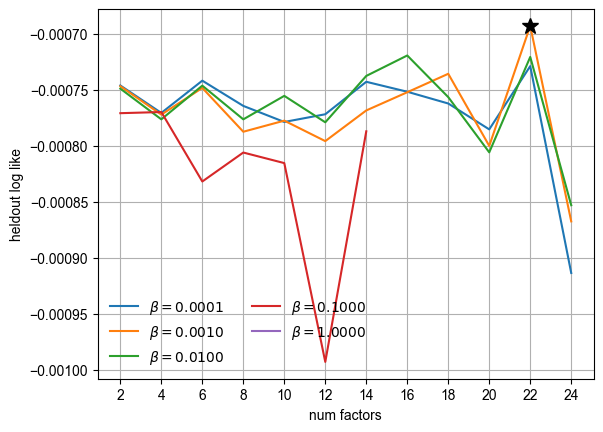

In [ ]:
for j, sparsity_penalty in enumerate(all_sparsity_penalties):
    plt.plot(all_num_factors, all_heldout_loglikes[j], label=r"$\beta={:.4f}$".format(sparsity_penalty))
plt.plot(best_num_factors, all_heldout_loglikes[istar, jstar], 'k*', ms=12)
plt.xticks(all_num_factors)
plt.grid(True)
plt.xlabel("num factors")
plt.ylabel("heldout log like")
#plt.ylim(-0.022, -0.018)
plt.legend(ncols=2)
plt.savefig(os.path.join(RESULTS_DIR, "cross_val.png"))

wandb.log({"cross_val": wandb.Image(os.path.join(RESULTS_DIR, "cross_val.png"))})

## Fit model with a chosen number of factors on all data

beta = 0.0010, numfactors 22

In [ ]:
initial_params = seminmf.initialize_nnsvd(counts, best_num_factors, mean_func, drugs=None)

In [ ]:
sparsity_penalty = 1e-2
elastic_net_frac = 1.0
num_iters = 500
num_coord_ascent_iters = 1

print("fitting model with", best_num_factors, "factors")
params, losses, heldout_loglikes = \
    seminmf.fit_poisson_seminmf(counts,
                        initial_params,
                        mask=None,
                        mean_func=mean_func,
                        sparsity_penalty=best_sparsity_penalty,
                        elastic_net_frac=elastic_net_frac,
                        num_iters=num_iters,
                        num_coord_ascent_iters=num_coord_ascent_iters,
                        tolerance=1e-5
                        )

# Log results to wandb
wandb.run.summary["final_loss"] = losses[-1]

fitting model with 22 factors
Shapes:
counts: (43, 3932613)
factors: (22, 3932613)
count_loadings: (43, 22)
count_row_effects: (43,)
count_col_effects: (3932613,)
counts dtype: int16
sparsity_penalty type: <class 'jaxlib.xla_extension.ArrayImpl'>
elastic_net_frac type: <class 'float'>


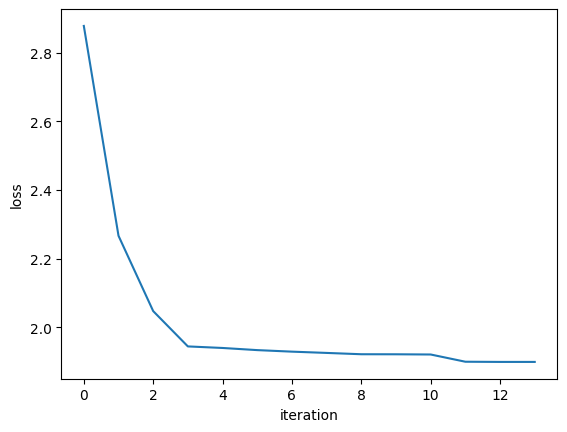

In [ ]:
plt.plot(losses)
plt.xlabel("iteration")
plt.ylabel("loss")

plt.savefig(os.path.join(RESULTS_DIR, "train_loss.png"))
wandb.log({"traing_loss": wandb.Image(os.path.join(RESULTS_DIR, "train_loss.png"))})

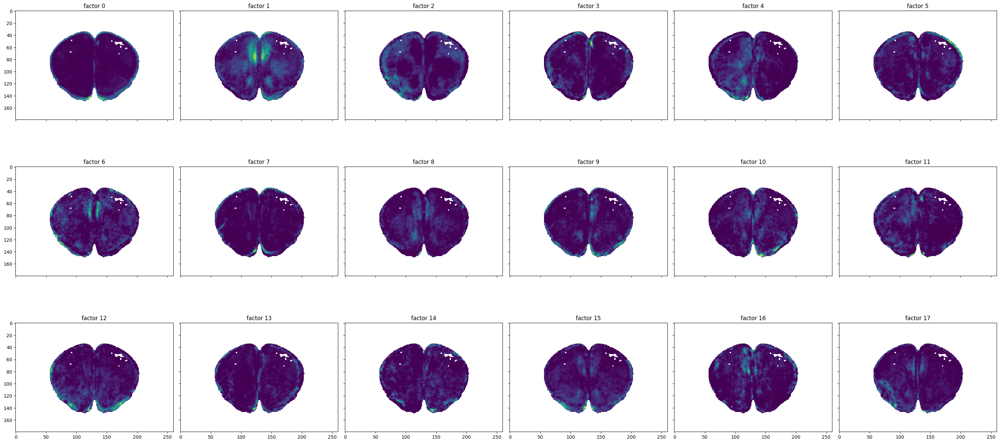

In [ ]:
fig, axs = plt.subplots(3, 6, figsize=(30, 15), sharey=True, sharex=True)
for k, ax in enumerate(axs.ravel()):
    if k < best_num_factors:
        plot_coronal(params.factors[k], z_idx=85, ax=ax)
        ax.set_title("factor {}".format(k))
    else:
        ax.set_visible(False)
        
plt.tight_layout()

plt.savefig(os.path.join(RESULTS_DIR, "factors.png"), dpi=300)
wandb.log({"factors": wandb.Image(os.path.join(RESULTS_DIR, "factors.png"))})

In [ ]:
# convert string values to integers using unique index
unique_drug_types = np.array(Conditions)
idx_drugs = np.array([np.where(unique_drug_types == drug)[0][0] for drug in drugs])


In [ ]:
idx_drugs

array([0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 1, 1, 1, 1, 1, 2, 2, 2, 2, 2, 2, 2,
       2, 3, 3, 3, 3, 3, 3, 3, 3, 4, 4, 4, 4, 4, 4, 5, 5, 5, 5, 5, 5])

In [ ]:
perm = jnp.argsort(idx_drugs)
bounds = jnp.cumsum(jnp.bincount(idx_drugs))-0.5

loadings = params.count_loadings
vmax = abs(loadings).max()


In [ ]:
vmax

Array(13452297., dtype=float32)

AttributeError: 'Axes' object has no attribute 'colorbar'

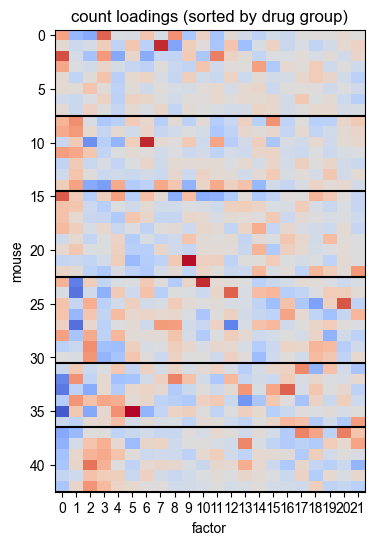

In [ ]:
fig,axs = plt.subplots(1,1,figsize= (4,6))
axs.imshow(loadings[perm], vmin=-vmax, vmax=vmax, cmap="coolwarm", aspect="auto", interpolation="none")
for bound in bounds:
    axs.axhline(bound, color='k')
_ = axs.set_xticks(np.arange(best_num_factors))

axs.set_xlabel("factor")
axs.set_ylabel("mouse")
axs.set_title("count loadings (sorted by drug group)")
axs.colorbar()
fig.savefig(os.path.join(RESULTS_DIR, "count_loadings_by_drug.png"), dpi=300,bbox_inches = 'tight')
fig.savefig(os.path.join(RESULTS_DIR, "count_loadings_by_drug.pdf"), dpi=300,bbox_inches = 'tight')


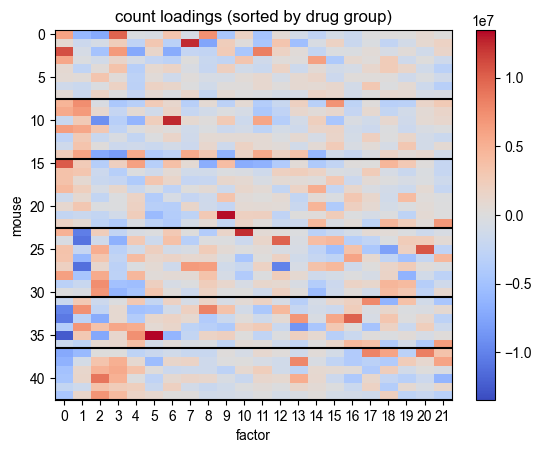

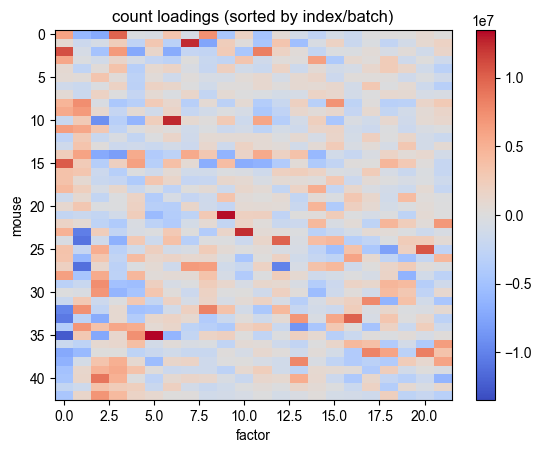

In [ ]:

plt.figure()
plt.imshow(loadings[perm], vmin=-vmax, vmax=vmax, cmap="coolwarm", aspect="auto", interpolation="none")
for bound in bounds:
    plt.axhline(bound, color='k')
_ = plt.xticks(np.arange(best_num_factors))

plt.xlabel("factor")
plt.ylabel("mouse")
plt.title("count loadings (sorted by drug group)")
plt.colorbar()
plt.savefig(os.path.join(RESULTS_DIR, "count_loadings_by_drug.png"), dpi=300)
plt.savefig(os.path.join(RESULTS_DIR, "count_loadings_by_drug.pdf"), dpi=300)

wandb.log({"count_loadings_by_drug": wandb.Image(os.path.join(RESULTS_DIR, "count_loadings_by_drug.png"))})


## Check downstream drug classification

In [ ]:
from sklearn.linear_model import LogisticRegression
from sklearn.model_selection import GridSearchCV, cross_val_predict
from sklearn.metrics import confusion_matrix

import warnings
warnings.filterwarnings("ignore")

# normalize weights and factors
def normalize_weights(weights):
    U = weights
    U = U - U.mean()
    U /= U.std()
    return(U)

def downstream_task(W, drugs, **kwargs):
    """
    kwargs
    ------
    cv: pass in the same CV splitter for both the grid search and the confusion matrix
    """
#     W_norm = normalize_weights(W)
    W_norm = W
    parameters = {"C":10 ** np.linspace(-15,15,num=31)}
    lr = LogisticRegression()
    gridsearch = GridSearchCV(lr, parameters, **kwargs)
    gridsearch.fit(W_norm, drugs)
    drug_clf_acc = gridsearch.best_score_
    classifier = gridsearch.best_estimator_
    drugs_pred = cross_val_predict(classifier, W_norm, y=drugs, **kwargs)
    confusion_mat = confusion_matrix(drugs, drugs_pred)
    return(classifier, drug_clf_acc, confusion_mat)

0.586111111111111


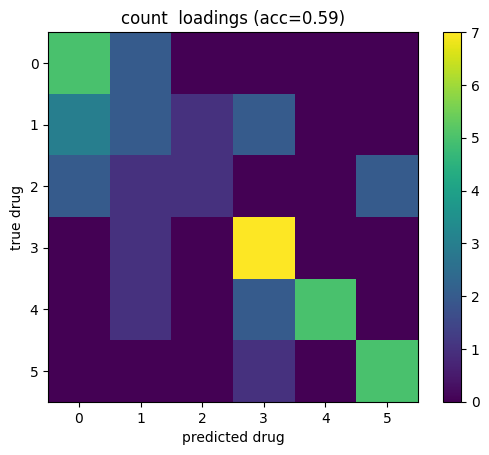

In [ ]:
features = jnp.hstack([normalize_weights(params.count_loadings),
                      ])
cv = KFold(shuffle=True, random_state=0)
clf, acc, cmat = downstream_task(features, drugs, cv=cv)

print(acc)
wandb.run.summary["count drug acc"] = acc


plt.imshow(cmat)
plt.ylabel("true drug")
plt.xlabel("predicted drug")
plt.title("count loadings (acc={:.2f})".format(acc))
plt.colorbar()

plt.savefig(os.path.join(RESULTS_DIR, "count_intensity_confmat.png"), dpi=300)
wandb.log({"count_intensity_confmat": wandb.Image(os.path.join(RESULTS_DIR, "count_intensity_confmat.png"))})

0.586111111111111


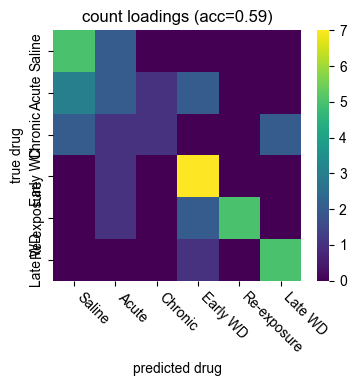

In [ ]:
features = jnp.hstack([normalize_weights(params.count_loadings),
#                        normalize_weights(params.intensity_loadings),
                      ])
cv = KFold(shuffle=True, random_state=0)
clf, acc, cmat = downstream_task(features, drugs, cv=cv)
print(acc)
#wandb.run.summary["count drug acc"] = acc

fig,axs = plt.subplots(1,1,figsize = (4,3.25))
sns.heatmap(cmat,ax = axs,cmap = 'viridis')
axs.set_title("count loadings (acc={:.2f})".format(acc))
axs.set_ylabel("true drug")
axs.set_xlabel("predicted drug")
#plt.colorbar(axs.images[0], ax=axs)

axs.set_xticks(np.array(range(len(Conditions))) + 0.5, Condition_figure_name, rotation=-45, ha='left')
axs.set_yticks(np.array(range(len(Conditions))) + 0.5, Condition_figure_name)

fig.savefig(os.path.join(RESULTS_DIR, "count_confmat.png"), dpi=216,bbox_inches = 'tight')
fig.savefig(os.path.join(RESULTS_DIR, "count_confmat.pdf"), dpi=216,bbox_inches = 'tight')

#wandb.log({"count_confmat": wandb.Image(os.path.join(RESULTS_DIR, "count_confmat.png"))})


## Sort factors by decoding importance

### Single feature decoding

In [ ]:
from fastprogress.fastprogress import master_bar, progress_bar

accs = -jnp.inf * jnp.ones(best_num_factors)
for j in progress_bar(range(best_num_factors)):
    features = jnp.column_stack([params.count_loadings[:,j:j+1],
                                 ])
    features = normalize_weights(features)
    cv = KFold(shuffle=True, random_state=0)
    _, acc, _ = downstream_task(features, drugs, cv=cv)
    accs = accs.at[j].set(acc)

factor_perm = jnp.argsort(accs)[::-1]
factor_perm

#wandb.run.summary["factor_perm_single"] = str(factor_perm)

Array([ 1,  3, 16,  4,  5, 15, 14, 12,  6,  8, 13,  0,  7,  2, 20, 21, 19,
       17, 11, 10,  9, 18], dtype=int32)

In [ ]:
accs

Array([0.09166667, 0.32777777, 0.07222223, 0.28055555, 0.19166666,
       0.16666667, 0.11944444, 0.07222223, 0.11666667, 0.04722222,
       0.04722222, 0.04722222, 0.11944444, 0.09444445, 0.11944444,
       0.11944444, 0.23055555, 0.04722222, 0.025     , 0.04722222,
       0.06666667, 0.04722222], dtype=float32)

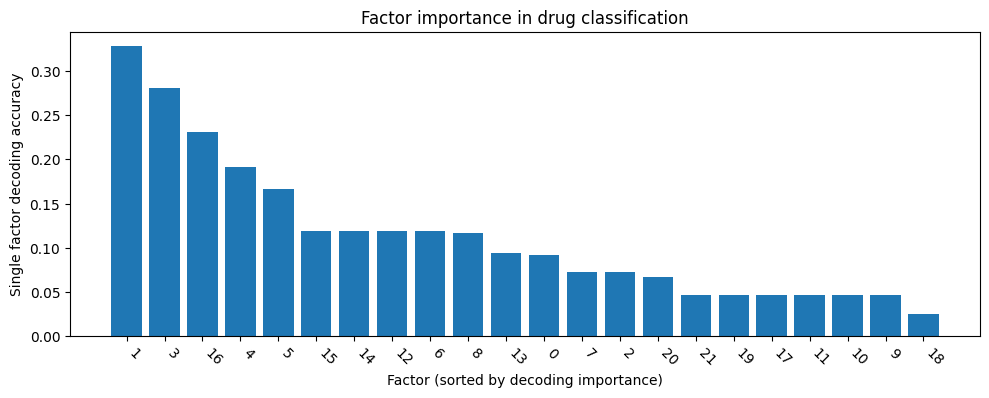

In [ ]:
plt.figure(figsize=(10, 4))
plt.bar(range(len(accs)), accs[factor_perm])
plt.xlabel("Factor (sorted by decoding importance)")
plt.ylabel("Single factor decoding accuracy")
plt.title("Factor importance in drug classification")
plt.tight_layout()
plt.xticks(range(len(accs)), factor_perm, rotation=-45, ha='left')
plt.savefig(os.path.join(RESULTS_DIR, "factor_importance.pdf"))
plt.savefig(os.path.join(RESULTS_DIR, "factor_importance.png"), dpi=300)

### Greedy Forward
Use a greedy forward procedure where we build up the model one feature at a time, adding the feature that most improves the classification accuracy. Intuitively, we expect this approach to yield an ordering that is similar to the norm of the weights of the full decoder, but that's not strictly guaranteed.

In [ ]:
from fastprogress.fastprogress import master_bar, progress_bar

indices = jnp.array([], dtype=int)

mb = master_bar(range(best_num_factors))        
for i in mb:
    accs = -jnp.inf * jnp.ones(best_num_factors)
    for j in progress_bar(range(best_num_factors), parent=mb):
        if j not in indices:
            features = jnp.column_stack([params.count_loadings[:,indices],
                                        
                                         params.count_loadings[:,j],
                                         
                                        ])
            features = normalize_weights(features)
            cv = KFold(shuffle=True, random_state=0)
            _, acc, _ = downstream_task(features, drugs, cv=cv)
            accs = accs.at[j].set(acc)
            
    best_j = jnp.argmax(accs)
    indices = jnp.insert(indices, 0, best_j)

factor_perm = indices[::-1]    
factor_perm

wandb.run.summary["factor_perm_greedyforward"] = str(factor_perm)

### Leave one out accuracy

How much does performance drop when we leave out one feature?

In [ ]:
# loo_acc = []

# for k in progress_bar(range(best_num_factors)):
    
#     features = jnp.hstack([params.count_loadings[:,:k],
#                            params.count_loadings[:,k+1:]])
#     features = normalize_weights(features)
#     cv = KFold(shuffle=True, random_state=0)
#     _, acc, _ = downstream_task(features, drugs, cv=cv)
#     loo_acc.append(acc)
    
# loo_acc = jnp.array(loo_acc)
# factor_perm = jnp.argsort(loo_acc)

In [ ]:
# features = normalize_weights(params.count_loadings)
# cv = KFold(shuffle=True, random_state=0)
# _, full_acc, _ = downstream_task(features, drugs, cv=cv)
# plt.bar(jnp.arange(best_num_factors), full_acc - loo_acc)

## Save factors to Python and matlab files

In [ ]:
import pickle
with open(os.path.join(RESULTS_DIR, "params.pkl"), 'wb') as f:
    pickle.dump(params, f)

artifact = wandb.Artifact(name="params_pkl", type="model")
artifact.add_file(local_path=os.path.join(RESULTS_DIR, "params.pkl"))
eval_run.log_artifact(artifact)

<Artifact params_pkl>

In [ ]:
from scipy.io import savemat
import numpy as onp
savemat(os.path.join(RESULTS_DIR, "params.mat"),
       dict(factors=onp.array(params.factors),
            count_loadings=onp.array(params.count_loadings),
            count_row_effects=onp.array(params.count_row_effects),
            count_col_effects=onp.array(params.count_col_effects),)

       )

artifact = wandb.Artifact(name="params_mat", type="model")
artifact.add_file(local_path=os.path.join(RESULTS_DIR, "params.mat"))
eval_run.log_artifact(artifact)

<Artifact params_mat>

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns
import os
from adjustText import adjust_text

# Set matplotlib parameters for white text on transparent background
plt.rcParams.update({
    'figure.facecolor': 'none',  # Transparent figure background
    'axes.facecolor': 'none',    # Transparent axes background
    'axes.edgecolor': 'black',   # White axes edge color
    'axes.labelcolor': 'black',  # White axis labels
    'xtick.color': 'black',      # White tick labels
    'ytick.color': 'black',      # White tick labels
    'legend.facecolor': 'none',  # Transparent legend background
    'legend.edgecolor': 'none',  # Transparent legend edgecolor
    'text.color': 'black',       # White text color
    'font.family':'Arial',
    'pdf.fonttype':42,
    'ps.fonttype':42,
   
})
#important for text to be detected when importing saved figures into illustrator


In [ ]:
count_loadings_df = pd.DataFrame(params.count_loadings,columns = [f'factor_{idx}' for idx in range(params.count_loadings.shape[1])])
# merge with metadf
count_loadings_df = count_loadings_df.join(metadf['Condition'])

In [ ]:
stack_count_loadings_df = count_loadings_df.set_index('Condition').stack().reset_index().rename(columns = {'level_1':'factor',0:'weights'})

In [ ]:
ave_stack_count_loadings_df = stack_count_loadings_df.groupby(['Condition','factor']).mean().reset_index().pivot(columns = 'factor',index = 'Condition',values = 'weights')
ave_stack_count_loadings_df = ave_stack_count_loadings_df.loc[Conditions,[f'factor_{idx}' for idx in range(22)]]

In [ ]:
Condition_color = ['gray','lime','orange','cyan','blue','purple']
Condition_figure_name = ['Saline','Acute','Chronic','Early WD','Re-exposure','Late WD'] 

In [ ]:
for group1,group2 in np.array(tukey_result._multicomp.pairindices).T:
    [romt]

[4 5]
[4 5]
[4 5]
[4 5]
[4 5]
[4 5]
[4 5]
[4 5]
[4 5]
[4 5]
[4 5]
[4 5]
[4 5]
[4 5]
[4 5]


In [ ]:
groups

[array([   98442.85,  1713594.5 ,  1374199.6 , -1411522.8 , -3107566.8 ,
        -1263375.8 , -3312187.2 ,  -587174.94], dtype=float32),
 array([ 2681628.2,  1372842.2,  1086708.1,  -176795.5, -1746467.9,
          672160.5, -1004044.2], dtype=float32),
 array([-2.1899938e+06, -2.1431362e+06, -1.5143850e+06, -2.1551272e+06,
        -1.7703572e+05, -5.3610965e+04, -1.3472469e+03,  6.8282595e+06],
       dtype=float32),
 array([ -555863.8 ,   525727.  , -2701890.5 ,  4422310.  ,  -329230.62,
        -2909786.8 , -1351824.4 ,   978802.8 ], dtype=float32),
 array([-4464470.5 ,   823939.  , -2859551.2 , -1488325.4 ,   217578.66,
         6438821.5 ], dtype=float32),
 array([ 3466616.2,  5897311. ,  -485845.9, -6159127. ,  1228699.2,
        -3183573.2], dtype=float32)]

In [ ]:
import pandas as pd
import numpy as np
from scipy import stats
from statsmodels.stats.multitest import multipletests

# Create a results DataFrame to store ANOVA results
results = []

# Get unique factors
factors = stack_count_loadings_df['factor'].unique()

# Store raw p-values for multiple testing correction
raw_p_values = []

# For each factor, perform ANOVA
for factor in factors:
    # Subset data for current factor
    factor_data = stack_count_loadings_df[stack_count_loadings_df['factor'] == factor]
    
    # Get all conditions except Saline
    conditions = [c for c in factor_data['Condition'].unique() if c != 'Saline']
    
    # Perform one-way ANOVA
    groups = [factor_data[factor_data['Condition'] == 'Saline']['weights'].values]
    for condition in conditions:
        groups.append(factor_data[factor_data['Condition'] == condition]['weights'].values)
    
    # Perform ANOVA
    f_stat, p_value = stats.f_oneway(*groups)
    raw_p_values.append(p_value)
    
    # Store results with placeholder for corrected p-value
    results.append({
        'factor': factor,
        'f_statistic': f_stat,
        'p_value': p_value,
        'significant_comparisons': []  # Will be filled after multiple testing correction
    })

# Convert results to DataFrame
results_df = pd.DataFrame(results)

# Perform multiple testing correction on ANOVA p-values
reject, pvals_corrected, _, _ = multipletests(raw_p_values, method='fdr_bh')

# Add corrected p-values to results DataFrame
results_df['corrected_p_value'] = pvals_corrected

# Now perform post-hoc tests only for factors with significant corrected p-values
for idx, row in results_df.iterrows():
    if row['corrected_p_value'] < 0.05:  # Using corrected p-value for decision
        factor = row['factor']
        factor_data = stack_count_loadings_df[stack_count_loadings_df['factor'] == factor]
        conditions = [c for c in factor_data['Condition'].unique() if c != 'Saline']
        
        significant_comparisons = []
        for condition in conditions:
            # Perform t-test between Saline and current condition
            saline_data = factor_data[factor_data['Condition'] == 'Saline']['weights'].values
            condition_data = factor_data[factor_data['Condition'] == condition]['weights'].values
            t_stat, p_val = stats.ttest_ind(saline_data, condition_data)
            
            if p_val < 0.05:
                significant_comparisons.append(f"Saline-{condition} (p={p_val:.4f})")
        
        # Update the significant comparisons in the results DataFrame
        results_df.at[idx, 'significant_comparisons'] = significant_comparisons

# Display results
print("\nANOVA Results:")
print(results_df)

# Print significant findings
print("\nSignificant Findings:")
for _, row in results_df.iterrows():
    if row['corrected_p_value'] < 0.05:
        print(f"\nFactor {row['factor']}:")
        print(f"ANOVA p-value: {row['p_value']:.4f}")
        print(f"Corrected p-value: {row['corrected_p_value']:.4f}")
        print("Significant comparisons with Saline:")
        for comp in row['significant_comparisons']:
            print(f"  - {comp}")

# write the results file
results_df.to_csv(os.path.join(RESULTS_DIR,'factor_anova_stat_df.csv'),index = False)


ANOVA Results:
       factor  f_statistic       p_value  \
0    factor_0     8.652788  1.672465e-05   
1    factor_1    11.606709  8.718547e-07   
2    factor_2     6.247591  2.702418e-04   
3    factor_3    13.555140  1.551865e-07   
4    factor_4     1.703753  1.580422e-01   
5    factor_5     1.604639  1.830488e-01   
6    factor_6     0.957420  4.562097e-01   
7    factor_7     0.637761  6.722451e-01   
8    factor_8     1.296683  2.863781e-01   
9    factor_9     1.100780  3.765439e-01   
10  factor_10     0.061831  9.972468e-01   
11  factor_11     0.248684  9.378192e-01   
12  factor_12     0.594658  7.041028e-01   
13  factor_13     0.860264  5.167872e-01   
14  factor_14     1.386556  2.517535e-01   
15  factor_15     0.765560  5.805171e-01   
16  factor_16     4.294486  3.517789e-03   
17  factor_17     0.361542  8.714560e-01   
18  factor_18     0.226914  9.484681e-01   
19  factor_19     0.316703  8.997636e-01   
20  factor_20     0.237326  9.434780e-01   
21  factor_21   

In [ ]:
# get the rejected factors
rejected_factor_idx = results_df.loc[results_df.corrected_p_value<0.05,'factor'].index

In [ ]:
import seaborn as sns
import matplotlib.pyplot as plt
import os

# Create directory for plots if it doesn't exist
tfigurepath = os.path.join(RESULTS_DIR, 'factors_by_condition')
if not os.path.exists(tfigurepath):
    os.mkdir(tfigurepath)

# Get unique factors from results_df
factors = results_df['factor'].unique()

def get_stars(p_value):
    """Return the appropriate number of stars based on p-value"""
    if p_value < 0.0001:
        return '****'
    elif p_value < 0.001:
        return '***'
    elif p_value < 0.01:
        return '**'
    elif p_value < 0.05:
        return '*'
    return ''

for factor in factors:
    # Create figure
    fig, axs = plt.subplots(1, 1, figsize=(2, 1.5))
    
    # Get the data for current factor
    factor_data = stack_count_loadings_df[stack_count_loadings_df.factor == factor]
    
    # Create strip plot
    sns.stripplot(data=factor_data,
                  y='weights',
                  x='Condition',
                  ax=axs,
                  palette=Condition_color,
                  order=Conditions,
                  alpha=0.5,
                  size=2)
    
    # Create point plot
    sns.pointplot(data=factor_data,
                  y='weights',
                  x='Condition',
                  palette=Condition_color,
                  order=Conditions,
                  ax=axs,
                  markers="o",
                  markersize=5,
                  linestyle="none",
                  linewidth=0.5)
    
    # Set y-axis limits
    axs.set_ylim(-1.5E+07, 1.5E+07)
    
    # Add horizontal line at y=0
    axs.axhline(0, ls=':', color='gray', alpha=0.3)
    
    # Set x-axis labels
    axs.set_xticklabels(Condition_figure_name, rotation=-45)
    
    # Get significant comparisons for this factor
    significant_comps = results_df[results_df['factor'] == factor]['significant_comparisons'].iloc[0]
    
    # Add stars for significant comparisons
    if significant_comps:  # If there are any significant comparisons
        for comp in significant_comps:
            # Extract condition name and p-value from the comparison string
            condition = comp.split('-')[1].split(' ')[0]  # Gets the condition name from "Saline-Condition (p=...)"
            p_value = float(comp.split('p=')[1].split(')')[0])  # Gets the p-value from "Saline-Condition (p=0.xxxx)"
            
            # Find the x position of this condition
            x_pos = Conditions.index(condition)
            
            # Get the appropriate number of stars
            stars = get_stars(p_value)
            
            # Add stars above the condition
            if stars:  # Only add if there are stars to show
                axs.text(x_pos, axs.get_ylim()[1] * 0.95, stars, 
                        ha='center', va='bottom', fontsize=12)
    
    # Remove spines
    sns.despine()
    
    # Save the figure
    fig.savefig(os.path.join(tfigurepath, f'{factor}.png'), dpi=216, bbox_inches='tight')
    fig.savefig(os.path.join(tfigurepath, f'{factor}.pdf'), dpi=216, bbox_inches='tight')
    
    # Close the figure to free memory
    plt.close(fig)

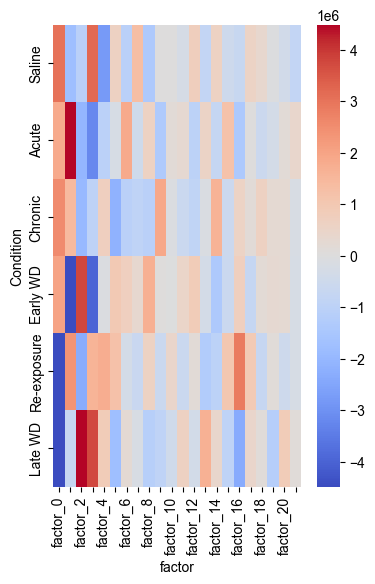

In [ ]:
fig,axs = plt.subplots(1,1,figsize = (4,6))
sns.heatmap(data = ave_stack_count_loadings_df, cmap="coolwarm",vmin = -vmax//3,vmax = vmax//3,ax = axs)
axs.set_xticks(np.array(range(22)) + 0.5)
axs.set_yticklabels(Condition_figure_name,rotation = 90)
fig.savefig(os.path.join(RESULTS_DIR,'average_count_loadings.png'),dpi= 216,bbox_inches = 'tight')
fig.savefig(os.path.join(RESULTS_DIR,'average_count_loadings.pdf'),dpi= 216,bbox_inches = 'tight')

In [ ]:
# run an anova 

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.colors import Normalize, to_rgba
import cv2
# 1. Automatic intensity adjustment
def adjust_intensity(image):
    min_val, max_val = np.min(image), np.max(image)
    return (image - min_val) / (max_val - min_val)

# 2. Convert base_image to color image using coolwarm colormap
def convert_to_coolwarm(image, cmin, cmax,colormap = plt.cm.viridis):
    norm = Normalize(vmin=cmin, vmax=cmax)
    return colormap(norm(image))

# 3. Maximize intensity of overlap_image and convert to color
def convert_overlap_image(image):
    norm_image = adjust_intensity(image)
    colormap = plt.cm.Greys  # Reverse grayscale; large values -> black
    return colormap(image)

# 4. Overlay the images
def overlay_images(base_color, overlap_color, alpha=0.5):
    #print(overlap_color)
    base_color[overlap_color == 0] = 1
    return base_color

# create a heatmap overlayed with a contour
def overlap_contour(base_image,overlap_image,cmin =  -100, cmax = 100,outputpath = False,colormap = plt.cm.viridis):
    # Load your data
    # Assuming `base_image` and `overlap_image` are already loaded as 3D numpy arrays.
    # Replace these with your data loading mechanism.
    #base_image = np.mean(norm_stm_array,axis = 0)
    #overlap_image = contour_img

    # Step 1: Adjust intensity of both images
    #base_image_adj = adjust_intensity(base_image)
    base_image_adj = base_image
    overlap_image_adj = adjust_intensity(overlap_image)

    # Step 2: Convert base_image to coolwarm colormap
      # Ensure symmetric range around 0
    base_image_color = convert_to_coolwarm(base_image_adj, cmin, cmax,colormap = colormap)

    # Step 3: Convert overlap_image to grayscale colormap
    overlap_image_color = convert_overlap_image(overlap_image_adj)

    # Step 4: Overlay the images
    overlayed_image = overlay_images(base_image_color, overlap_image_color, alpha=1)

    # write the result
    if outputpath:
        tifffile.imwrite(outputpath, overlayed_image)
    return base_image_adj,overlayed_image



## Save factors to tiff stack

In [ ]:
input_voxel_shape

(300, 450, 650)

In [ ]:
def upsample(arr, target_voxel_shape):
    """
    Upsample a 3D array to target voxel shape using nearest neighbor interpolation
    
    Args:
        arr: 3D numpy array to upsample
        target_voxel_shape: Tuple of (z,y,x) target dimensions
        
    Returns:
        Upsampled array with shape target_voxel_shape
    """
    from scipy.ndimage import zoom
    
    # Calculate zoom factors for each dimension
    zoom_factors = [t/c for t,c in zip(target_voxel_shape, arr.shape)]
    
    # Upsample using nearest neighbor interpolation
    upsampled = zoom(arr, zoom_factors, order=0)
    
    return upsampled
    

In [ ]:
from tifffile import imsave

def save_factor(factor, filename):
    arr = jnp.zeros(alive_voxels.shape)
    arr = arr.at[alive_voxels].set(factor)
    #arr = jnp.transpose(arr, (1, 2, 0))
    arr /= arr.max()
    #imsave(filename, arr)
    arr = upsample(arr,input_voxel_shape)
    np.save(filename, arr)
    
os.mkdir(os.path.join(RESULTS_DIR, "npy"))
for k, factor in enumerate(params.factors):
    fname = os.path.join(RESULTS_DIR, "npy", "factor{}.npy".format(k))
    save_factor(factor, fname)


In [ ]:
# Create zarr array to store factors
import zarr
import dask.array as da
from pathlib import Path

# Get shape from first factor
fname = os.path.join(RESULTS_DIR, "npy", "factor0.npy") 
first_factor = np.load(fname)
factor_shape = first_factor.flatten().shape

# Initialize zarr array with correct shape for all factors
zarr_path = os.path.join(RESULTS_DIR, "factors.zarr")
z = zarr.open(zarr_path, mode='w', shape=(22, *factor_shape), chunks=(1, *factor_shape), dtype=np.float32)

# Write each factor one at a time
for k in range(22):
    fname = os.path.join(RESULTS_DIR, "npy", f"factor{k}.npy")
    # Load as dask array to avoid loading into memory
    factor_da = da.from_array(np.load(fname))
    # Write to zarr array
    z[k] = factor_da.flatten()


In [ ]:
RESULTS_DIR

'\\\\10.159.50.7\\LabCommon\\Ken\\data\\Opioid_cFos\\spatial_clustering_results\\2025_04_02-12_34'

In [ ]:
# read the zarr file as a dask.array
factors_da = da.from_zarr(os.path.join(RESULTS_DIR, "factors.zarr"))
factors_da

dask.array<from-zarr, shape=(22, 87750000), dtype=float32, chunksize=(1, 87750000), chunktype=numpy.ndarray>

100%|██████████| 22/22 [09:56<00:00, 27.10s/it]


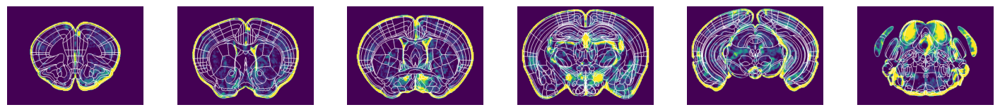

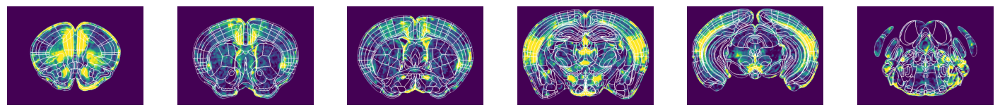

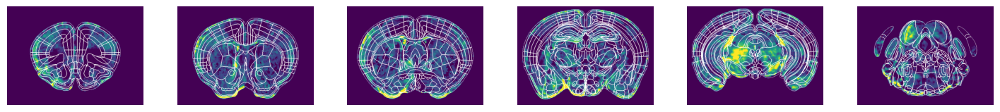

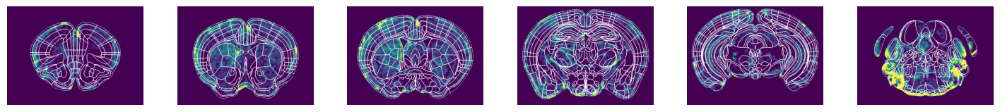

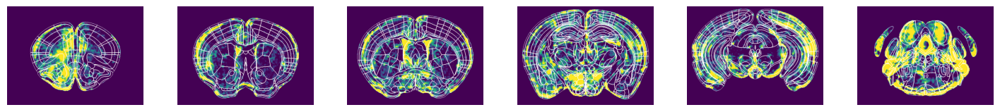

...

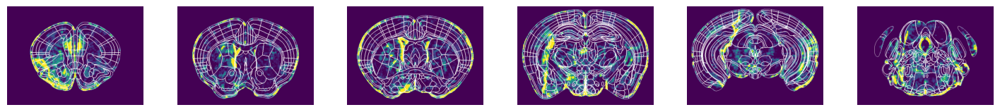

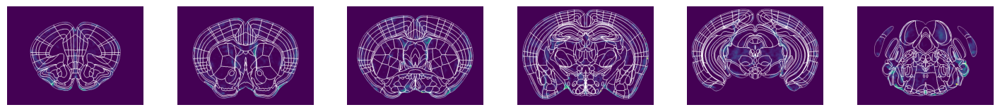

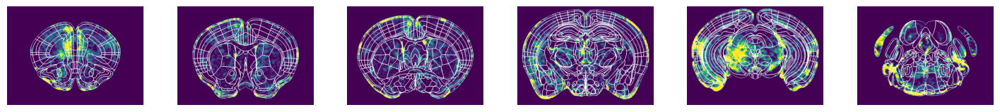

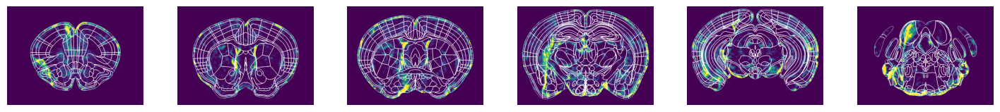

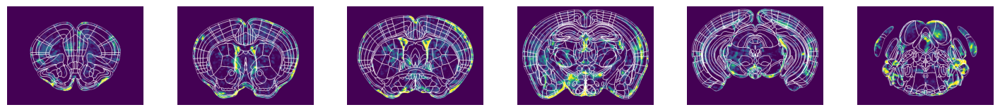

In [ ]:
import contour_visualization2 as cv2

# pre selected zplanes
curated_zplanes = [84,104,117,153,186,220]
# slice for visualization
imy_slice = slice(int(25),int(425))
imx_slice = slice(int(50),int(600))

if not os.path.exists(os.path.join(RESULTS_DIR,'selected_regions')):
    os.mkdir(os.path.join(RESULTS_DIR,'selected_regions'))

from tqdm import tqdm

for k in tqdm(range(22)):
    
    # read the npy
    fname = os.path.join(RESULTS_DIR, "npy", "factor{}.npy".format(k))
    theatmap = np.load(fname)
    
    # plot every 10 zplanes
    fig,axs = plt.subplots(1,len(curated_zplanes),figsize = (3*len(curated_zplanes),3),sharey = True)
    fig.subplots_adjust(wspace=0.25, hspace=0.3)
    for idx,ax in enumerate(axs):
        formatted_idx = f"{curated_zplanes[idx]:04}" 
        
        
        __,overlayed_image = overlap_contour(theatmap,contour_img,\
        cmin =  0, cmax = 0.00015,\
        outputpath = None,colormap = plt.cm.viridis)
        ax.imshow(overlayed_image[curated_zplanes[idx],imy_slice,imx_slice,:])
        ax.axis('off')
        ax.set_title('')
        ax.set_ylabel(f"factor{k}",color = 'black')
    fig.savefig(os.path.join(RESULTS_DIR,'selected_regions',f'factor{k}_selected_regions.png'),bbox_inches='tight',dpi = 1024)
    fig.savefig(os.path.join(RESULTS_DIR,'selected_regions',f'factor{k}_selected_regions.pdf'),bbox_inches='tight',dpi = 1024)


100%|██████████| 22/22 [02:48<00:00,  7.65s/it]


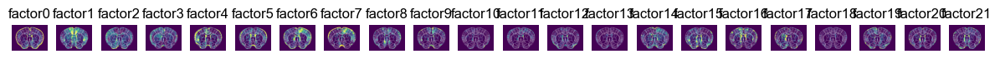

In [ ]:
import contour_visualization2 as cv2

# pre selected zplanes
curated_zplane = 104
# slice for visualization
imy_slice = slice(int(25),int(425))
imx_slice = slice(int(50),int(600))

if not os.path.exists(os.path.join(RESULTS_DIR,'selected_regions')):
    os.mkdir(os.path.join(RESULTS_DIR,'selected_regions'))

from tqdm import tqdm

fig,axs = plt.subplots(1,22,figsize = (15,3),sharey = True)
fig.subplots_adjust(wspace=0.25, hspace=0.3)
for k in tqdm(range(22)):
    # read the npy
    fname = os.path.join(RESULTS_DIR, "npy", "factor{}.npy".format(k))
    theatmap = np.load(fname)
    
    # plot every 10 zplanes

    # plot every 10 zplanes
    ax = axs[k]

    formatted_idx = f"{curated_zplanes[idx]:04}" 
    
    
    __,overlayed_image = overlap_contour(theatmap,contour_img,\
    cmin =  0, cmax = 0.00015,\
    outputpath = None,colormap = plt.cm.viridis)
    ax.imshow(overlayed_image[curated_zplane,imy_slice,imx_slice,:])
    ax.axis('off')
    ax.set_title(f"factor{k}",color = 'black')
fig.savefig(os.path.join(RESULTS_DIR,'selected_regions',f'curated_zplane{curated_zplane}_factors.png'),bbox_inches='tight',dpi = 1024)
fig.savefig(os.path.join(RESULTS_DIR,'selected_regions',f'curated_zplane{curated_zplane}_factors.pdf'),bbox_inches='tight',dpi = 1024)


In [ ]:
'''
artifact = wandb.Artifact(name="factor_tiffs", type="tif")
artifact.add_dir(local_path=os.path.join(RESULTS_DIR, "tiff"))
eval_run.log_artifact(artifact)'''

In [ ]:
RESULTS_DIR

'\\\\10.159.50.7\\LabCommon\\Ken\\data\\Opioid_cFos\\spatial_clustering_results\\2025_04_02-12_34'

### Finish the WANDB Run

In [ ]:
wandb.finish()

count drug acc,0.58611
count+intensity drug acc,0.58611
factor_perm_greedyforward,[ 1 2 0 18 20 5 ...
factor_perm_single,[ 1 3 16 4 5 15 1...
final_loss,1.89888


# Figure 6: spatial analysis of NAc

In [ ]:
import create_mask_for_region

In [ ]:
atlas_df = pd.read_csv(r"\\10.159.50.7\Analysis2\Ken\ClearMap\clearmap_ressources_mouse_brain\ClearMap_ressources\Regions_annotations\atlas_info_KimRef_FPbasedLabel_v4.0_brain_with_size_with_curated_with_cleaned_acronyms.csv",index_col = False)

conduct analysis of NAc distribution

In [ ]:
# target site can be experiment specific
target_site_acronym = 'Acb'
target_site_id = atlas_df.loc[atlas_df.acronym == target_site_acronym,'id'].values[0]
target_site_subids = create_mask_for_region.get_subregions(atlas_df,target_site_id,return_original=True)['id'].values
target_site_subacronyms = create_mask_for_region.get_subregions(atlas_df,target_site_id,return_original=True)['acronym'].values

In [ ]:
# collect all the z positions where there is the target site
zs = np.array([])
for ID in target_site_subids:
    z_,y_,x_ = np.where(atlas_img == ID)
    zs = np.concatenate([zs,z_])
# find the center of mass of the VTA
z_unique = np.unique(zs).astype('uint16')
z_center = int(np.mean(zs))

In [ ]:
subset_heatmap = np.reshape(factors_da,[22] + list(atlas_img.shape)).compute()

In [ ]:
subset_heatmap.shape

(22, 300, 450, 650)

In [ ]:
# calculate the spatial distribution of c-Fos+ cells for each subject
spatial_cell_count_for_subregion = np.array([[[np.nanmean(subset_heatmap[f,z,np.where(atlas_img[z,:,:] == target_site_subid)[0],np.where(atlas_img[z,:,:] == target_site_subid)[1]]) for z in z_unique] for target_site_subid in target_site_subids] for f in range(22)])
# append spatial_c

In [ ]:
# calculate cell count for full region
spatial_cell_count_for_full = np.nansum(spatial_cell_count_for_subregion,axis = 1)

In [ ]:
np.save(os.path.join(analysis_resultpath,f'spatial_factors_for_subregion_sum_{target_site_acronym}.npy'),spatial_cell_count_for_full,)
np.save(os.path.join(analysis_resultpath,f'spatial_factors_for_subregion_{target_site_acronym}.npy'),spatial_cell_count_for_subregion,)

In [ ]:
# split the Acumbens into anterior middle posterior
z_anterior,z_medial,z_posterior = np.array_split(z_unique, 3)

In [ ]:
from statannotations.Annotator import Annotator
pairs = [("Saline","Acute_Morphine"),("Saline","Chronic_Morphine"),("Saline","Withdrawal_Morphine"),
("Chronic_Morphine","Acute_Morphine"),("Withdrawal_Morphine","Acute_Morphine"),("Withdrawal_Morphine","Chronic_Morphine"),]

for tidx, target_site_subid in enumerate(target_site_subids[:3]):
    #fig,axs = plt.subplots(1,1,figsize = (4,2))
    target_region = atlas_df.loc[atlas_df['id'] == target_site_subid,'acronym'].values[0]
    tdf_all = pd.read_csv(os.path.join(analysis_figurepath,f'cell_count_{target_region}_spatial_distibution.csv'),index_col = 0)

    # find rows in tdf_all that have valuse in column zposition that are contained in z_anterior
    fig,axs = plt.subplots(1,3,figsize = (1.5*3,2*1),sharey = True)
    sub_tdf_all = tdf_all[tdf_all.Condition.isin(Conditions)]
    for zidx,z_ in enumerate([z_anterior,z_medial,z_posterior]):
        df = sub_tdf_all[sub_tdf_all.zposition.isin(z_ - min(z_anterior))]
        df = df.groupby(['Condition','subject']).mean().reset_index()
        sns.boxplot(data = df,order = Conditions,
        x = 'Condition',y = 'density',ax = axs[zidx],palette = Condition_color)
        #sns.swarmplot(data = sub_tdf_all[sub_tdf_all.zposition.isin(z_medial - min(z_anterior))],
        # x = 'Condition',y = 'density',ax = axs,palette = Condition_color[:4],dodge = True,linewidth = 1,edgecolor = 'k') 
        axs[zidx].set_xticklabels(Condition_figure_name,rotation = -45)
        axs[zidx].set_title(['anterior','medial','posterior'][zidx])
        sns.despine()

        annotator = Annotator(axs[zidx], pairs, data=df, x='Condition', y='density', order=Conditions[:4])
        annotator.configure(test='t-test_ind', text_format='star', loc='outside',)
        annotator.configure(comparisons_correction="BH", correction_format="replace")
        annotator.apply_and_annotate()
        axs[zidx].set_ylim(0,15)

    fig.savefig(os.path.join(analysis_figurepath,f'cell_count_{target_region}_spatial_distibution_boxplot.png'),bbox_inches='tight',dpi = 512)
    fig.savefig(os.path.join(analysis_figurepath,f'cell_count_{target_region}_spatial_distibution_boxplot.pdf'),bbox_inches='tight',dpi = 512)

NameError: name 'analysis_figurepath' is not defined

In [ ]:
# subset to NAc region
xslice = slice(325,325+120)
yslice = slice(240,240+120)

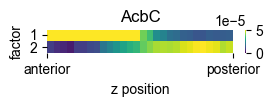

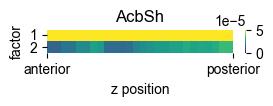

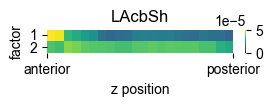

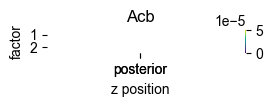

In [ ]:
for  idx,sub_acronym in enumerate(target_site_subacronyms):
    sub_factors = [1,2]
    #tarray = spatial_cell_count_for_subregion[rejected_factor_idx,idx,:]
    tarray = spatial_cell_count_for_subregion[sub_factors,idx,:]
    tarray = tarray[:,~np.isnan(tarray[0,:])]


    fig,axs = plt.subplots(1,1,figsize = (3,0.3))
    sns.heatmap(tarray,ax = axs,cmap = 'viridis',vmin = 0,vmax= 5E-5)
    axs.set_title(sub_acronym)
    axs.set_yticks(np.array(range(len(sub_factors))) + 0.5)
    axs.set_yticklabels(sub_factors,rotation = 0)
    axs.set_xticks([0,tarray.shape[1]])
    axs.set_xticklabels(['anterior','posterior'])    
    axs.set_ylabel('factor')
    axs.set_xlabel('z position')
    fig.savefig(os.path.join(RESULTS_DIR,f'{sub_acronym}_factors_spatial_distribution.png'),bbox_inches='tight',dpi = 512)
    fig.savefig(os.path.join(RESULTS_DIR,f'{sub_acronym}_factors_spatial_distribution.pdf'),bbox_inches='tight',dpi = 512)



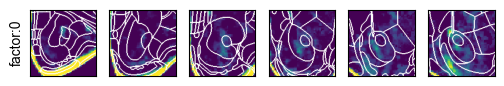

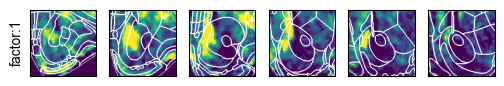

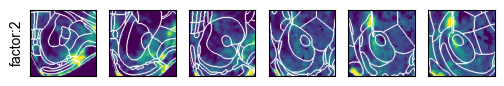

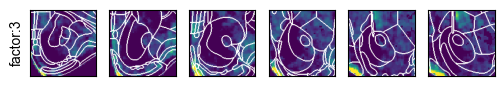

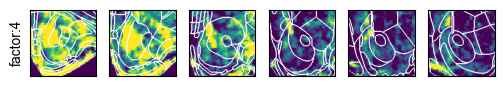

...

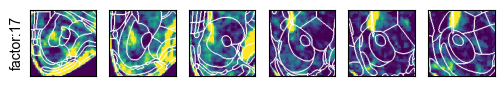

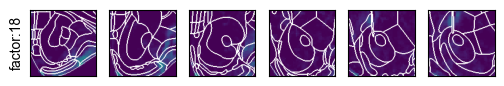

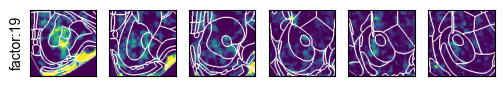

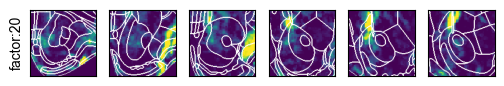

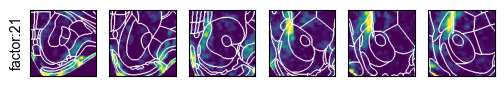

In [ ]:
# plot the spatial distribution of starter cells for each subject



for cidx, __ in enumerate(range(22)):
    fig, axs = plt.subplots(1, len(z_unique[::5]), figsize=(len(z_unique[::5])*1.0, 1), sharex=True,sharey = True)
    theatmap = factors_da[cidx,:].reshape(atlas_img.shape).compute()
    __,overlayed_image = overlap_contour(theatmap[:,:,::-1],contour_img,\
        cmin =  0, cmax = 0.00015,\
        outputpath = None)
    for idx, curated_zplane in enumerate(z_unique[::5]):
        ax = axs[idx]
        ax.imshow(overlayed_image[curated_zplane,yslice,xslice])
        ax.set_xticks([])  # Remove x ticks
        ax.set_yticks([])  # Remove y ticks
        #ax.axis('off')
        if idx == 0:
            ax.set_ylabel(f'factor:{cidx}', color='black', )
        else:
            ax.set_ylabel('', color='black',)
    fig.savefig(os.path.join(RESULTS_DIR,f'{target_site_acronym}_factors_{cidx}_spatial_distibution.png'),bbox_inches='tight',dpi = 512)
    fig.savefig(os.path.join(RESULTS_DIR,f'{target_site_acronym}_factors_{cidx}_spatial_distibution.pdf'),bbox_inches='tight',dpi = 512)

# Figure 6: spatial analysis of Ce

conduct analysis of NAc distribution

In [ ]:
results_df = pd.read_csv(os.path.join(RESULTS_DIR,'factor_anova_stat_df.csv'),index_col = False)

In [ ]:
rejected_factor_idx = results_df[results_df.corrected_p_value < 0.05].index

In [ ]:
# target site can be experiment specific
target_site_acronym = 'Ce'
target_site_id = atlas_df.loc[atlas_df.acronym == target_site_acronym,'id'].values[0]
target_site_subids = create_mask_for_region.get_subregions(atlas_df,target_site_id,return_original=True)['id'].values

In [ ]:
target_site_subacronyms = create_mask_for_region.get_subregions(atlas_df,target_site_id,return_original=True)['acronym'].values

In [ ]:
# collect all the z positions where there is the target site
zs = np.array([])
for ID in target_site_subids:
    z_,y_,x_ = np.where(atlas_img == ID)
    zs = np.concatenate([zs,z_])
# find the center of mass of the VTA
z_unique = np.unique(zs).astype('uint16')
z_center = int(np.mean(zs))

In [ ]:
subset_heatmap = np.reshape(factors_da,[22] + list(atlas_img.shape)).compute()

In [ ]:
# calculate the spatial distribution of c-Fos+ cells for each subject
spatial_cell_count_for_subregion = np.array([[[np.nanmean(subset_heatmap[f,z,np.where(atlas_img[z,:,:] == target_site_subid)[0],np.where(atlas_img[z,:,:] == target_site_subid)[1]]) for z in z_unique] for target_site_subid in target_site_subids] for f in range(22)])
# append spatial_c

In [ ]:
# calculate cell count for full region
spatial_cell_count_for_full = np.nansum(spatial_cell_count_for_subregion,axis = 1)

In [ ]:
np.save(os.path.join(analysis_resultpath,f'spatial_factors_for_subregion_sum_{target_site_acronym}.npy'),spatial_cell_count_for_full,)
np.save(os.path.join(analysis_resultpath,f'spatial_factors_for_subregion_{target_site_acronym}.npy'),spatial_cell_count_for_subregion,)

In [ ]:
# split the Acumbens into anterior middle posterior
z_anterior,z_medial,z_posterior = np.array_split(z_unique, 3)

In [ ]:
# subset to Ce region
xslice = slice(420,420+120)
yslice = slice(245,245+120)

array([[1.30067665e-05, 1.24631042e-05, 1.62680226e-05, 1.65229631e-05,
        1.60670515e-05, 1.44682799e-05, 5.95562278e-06, 5.70335851e-06,
        8.17770615e-06, 8.81421965e-06, 9.77472337e-06, 1.15331068e-05,
        1.05851914e-05, 1.27225703e-05, 1.88262820e-05, 1.90169994e-05,
        1.64437715e-05, 1.61673361e-05, 1.55067210e-05, 1.32934510e-05,
        1.35568853e-05, 1.27059247e-05, 1.25065853e-05, 1.20088671e-05],
       [2.26155453e-06, 2.19284902e-06, 6.99349755e-07, 5.68765984e-07,
        1.84027147e-06, 2.18677951e-06, 7.05695447e-06, 5.90739546e-06,
        4.52724498e-06, 5.49447304e-06, 4.63944934e-06, 3.88453464e-06,
        1.27209687e-05, 1.65357305e-05, 1.70345829e-05, 1.90401170e-05,
        1.70151870e-05, 1.80014285e-05, 1.75290061e-05, 1.48434065e-05,
        1.22648771e-05, 8.49635671e-06, 4.39635778e-06, 2.22015319e-06],
       [3.96916657e-05, 4.00823883e-05, 4.59603252e-05, 4.43390782e-05,
        4.53204811e-05, 4.27144587e-05, 3.99360033e-05, 4.0539

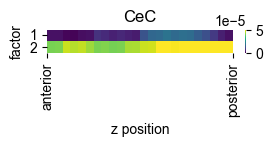

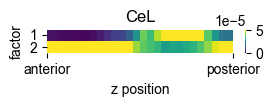

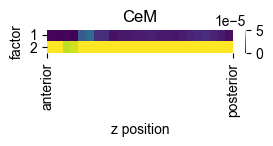

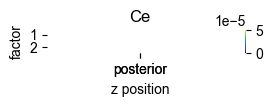

In [ ]:
for  idx,sub_acronym in enumerate(target_site_subacronyms):
    sub_factors = [1,2]
    #tarray = spatial_cell_count_for_subregion[rejected_factor_idx,idx,:]
    tarray = spatial_cell_count_for_subregion[sub_factors,idx,:]
    tarray = tarray[:,~np.isnan(tarray[0,:])]


    fig,axs = plt.subplots(1,1,figsize = (3,0.3))
    sns.heatmap(tarray,ax = axs,cmap = 'viridis',vmin = 0,vmax= 5E-5)
    axs.set_title(sub_acronym)
    axs.set_yticks(np.array(range(len(sub_factors))) + 0.5)
    axs.set_yticklabels(sub_factors,rotation = 0)
    axs.set_xticks([0,tarray.shape[1]])
    axs.set_xticklabels(['anterior','posterior'])    
    axs.set_ylabel('factor')
    axs.set_xlabel('z position')
    fig.savefig(os.path.join(RESULTS_DIR,f'{sub_acronym}_factors_spatial_distribution.png'),bbox_inches='tight',dpi = 512)
    fig.savefig(os.path.join(RESULTS_DIR,f'{sub_acronym}_factors_spatial_distribution.pdf'),bbox_inches='tight',dpi = 512)



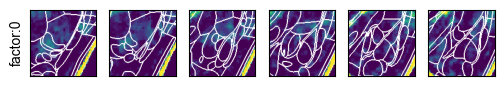

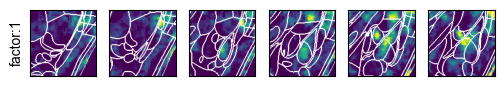

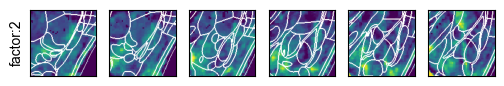

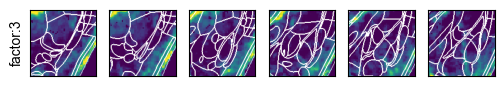

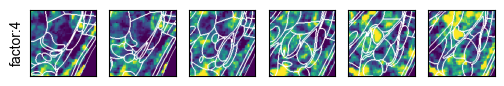

...

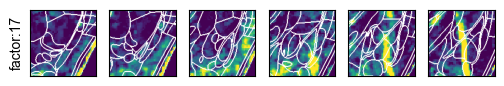

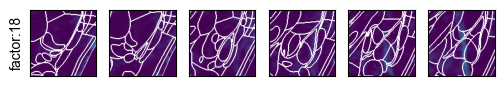

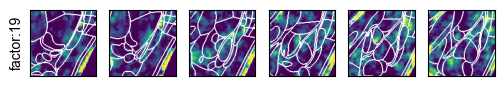

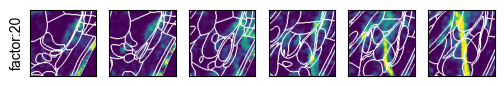

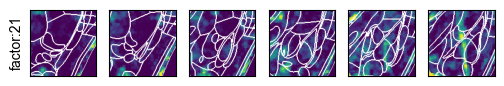

In [ ]:
# plot the spatial distribution of starter cells for each subject
if not os.path.exists(os.path.join(RESULTS_DIR,f'{target_site_acronym}_factors')):
    os.mkdir(os.path.join(RESULTS_DIR,f'{target_site_acronym}_factors'))


for cidx, __ in enumerate(range(22)):
    fig, axs = plt.subplots(1, len(z_unique[::5]), figsize=(len(z_unique[::5])*1.0, 1), sharex=True,sharey = True)
    theatmap = factors_da[cidx,:].reshape(atlas_img.shape).compute()
    __,overlayed_image = overlap_contour(theatmap[:,:,::-1],contour_img,\
        cmin =  0, cmax = 0.00015,\
        outputpath = None)
    for idx, curated_zplane in enumerate(z_unique[::5]):
        ax = axs[idx]
        ax.imshow(overlayed_image[curated_zplane,yslice,xslice])
        ax.set_xticks([])  # Remove x ticks
        ax.set_yticks([])  # Remove y ticks
        #ax.axis('off')
        if idx == 0:
            ax.set_ylabel(f'factor:{cidx}', color='black', )
        else:
            ax.set_ylabel('', color='black',)
    fig.savefig(os.path.join(RESULTS_DIR,f'{target_site_acronym}_factors',f'{target_site_acronym}_factors_{cidx}_spatial_distibution.png'),bbox_inches='tight',dpi = 512)
    fig.savefig(os.path.join(RESULTS_DIR,f'{target_site_acronym}_factors',f'{target_site_acronym}_factors_{cidx}_spatial_distibution.pdf'),bbox_inches='tight',dpi = 512)

# Figure 6: spatial analysis of BLA

conduct analysis of NAc distribution

In [ ]:
results_df = pd.read_csv(os.path.join(RESULTS_DIR,'factor_anova_stat_df.csv'),index_col = False)

In [ ]:
rejected_factor_idx = results_df[results_df.corrected_p_value < 0.05].index

In [ ]:
# target site can be experiment specific
target_site_acronym = 'BLA'
target_site_id = atlas_df.loc[atlas_df.acronym == target_site_acronym,'id'].values[0]
target_site_subids = create_mask_for_region.get_subregions(atlas_df,target_site_id,return_original=True)['id'].values

In [ ]:
target_site_subacronyms = create_mask_for_region.get_subregions(atlas_df,target_site_id,return_original=True)['acronym'].values

In [ ]:
# collect all the z positions where there is the target site
zs = np.array([])
for ID in target_site_subids:
    z_,y_,x_ = np.where(atlas_img == ID)
    zs = np.concatenate([zs,z_])
# find the center of mass of the VTA
z_unique = np.unique(zs).astype('uint16')
z_center = int(np.mean(zs))

In [ ]:
subset_heatmap = np.reshape(factors_da,[22] + list(atlas_img.shape)).compute()

In [ ]:
# calculate the spatial distribution of c-Fos+ cells for each subject
spatial_cell_count_for_subregion = np.array([[[np.nanmean(subset_heatmap[f,z,np.where(atlas_img[z,:,:] == target_site_subid)[0],np.where(atlas_img[z,:,:] == target_site_subid)[1]]) for z in z_unique] for target_site_subid in target_site_subids] for f in range(22)])
# append spatial_c

In [ ]:
# calculate cell count for full region
spatial_cell_count_for_full = np.nansum(spatial_cell_count_for_subregion,axis = 1)

In [ ]:
np.save(os.path.join(analysis_resultpath,f'spatial_factors_for_subregion_sum_{target_site_acronym}.npy'),spatial_cell_count_for_full,)
np.save(os.path.join(analysis_resultpath,f'spatial_factors_for_subregion_{target_site_acronym}.npy'),spatial_cell_count_for_subregion,)

In [ ]:
# split the Acumbens into anterior middle posterior
z_anterior,z_medial,z_posterior = np.array_split(z_unique, 3)

In [ ]:
# subset to Ce region
xslice = slice(420,420+120)
yslice = slice(245,245+120)

In [ ]:
spatial_cell_count_for_full.shape

(22, 32)

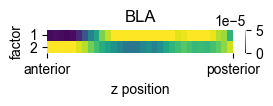

In [ ]:
sub_factors = [1,2]
#tarray = spatial_cell_count_for_subregion[rejected_factor_idx,idx,:]
tarray = spatial_cell_count_for_full[sub_factors,:]
tarray = tarray[:,~np.isnan(tarray[0,:])]


fig,axs = plt.subplots(1,1,figsize = (3,0.3))
sns.heatmap(tarray,ax = axs,cmap = 'viridis',vmin = 0,vmax= 5E-5)
axs.set_title(target_site_acronym)
axs.set_yticks(np.array(range(len(sub_factors))) + 0.5)
axs.set_yticklabels(sub_factors,rotation = 0)
axs.set_xticks([0,tarray.shape[1]])
axs.set_xticklabels(['anterior','posterior'])    
axs.set_ylabel('factor')
axs.set_xlabel('z position')
fig.savefig(os.path.join(RESULTS_DIR,f'{target_site_acronym}_factors_spatial_distribution.png'),bbox_inches='tight',dpi = 512)
fig.savefig(os.path.join(RESULTS_DIR,f'{target_site_acronym}_factors_spatial_distribution.pdf'),bbox_inches='tight',dpi = 512)



# Figure 6: spatial analysis of La

conduct analysis of NAc distribution

In [ ]:
results_df = pd.read_csv(os.path.join(RESULTS_DIR,'factor_anova_stat_df.csv'),index_col = False)

In [ ]:
rejected_factor_idx = results_df[results_df.corrected_p_value < 0.05].index

In [ ]:
# target site can be experiment specific
target_site_acronym = 'La'
target_site_id = atlas_df.loc[atlas_df.acronym == target_site_acronym,'id'].values[0]
target_site_subids = create_mask_for_region.get_subregions(atlas_df,target_site_id,return_original=True)['id'].values

In [ ]:
target_site_subacronyms = create_mask_for_region.get_subregions(atlas_df,target_site_id,return_original=True)['acronym'].values

In [ ]:
# collect all the z positions where there is the target site
zs = np.array([])
for ID in target_site_subids:
    z_,y_,x_ = np.where(atlas_img == ID)
    zs = np.concatenate([zs,z_])
# find the center of mass of the VTA
z_unique = np.unique(zs).astype('uint16')
z_center = int(np.mean(zs))

In [ ]:
subset_heatmap = np.reshape(factors_da,[22] + list(atlas_img.shape)).compute()

In [ ]:
# calculate the spatial distribution of c-Fos+ cells for each subject
spatial_cell_count_for_subregion = np.array([[[np.nanmean(subset_heatmap[f,z,np.where(atlas_img[z,:,:] == target_site_subid)[0],np.where(atlas_img[z,:,:] == target_site_subid)[1]]) for z in z_unique] for target_site_subid in target_site_subids] for f in range(22)])
# append spatial_c

In [ ]:
# calculate cell count for full region
spatial_cell_count_for_full = np.nansum(spatial_cell_count_for_subregion,axis = 1)

In [ ]:
np.save(os.path.join(analysis_resultpath,f'spatial_factors_for_subregion_sum_{target_site_acronym}.npy'),spatial_cell_count_for_full,)
np.save(os.path.join(analysis_resultpath,f'spatial_factors_for_subregion_{target_site_acronym}.npy'),spatial_cell_count_for_subregion,)

In [ ]:
# split the Acumbens into anterior middle posterior
z_anterior,z_medial,z_posterior = np.array_split(z_unique, 3)

In [ ]:
# subset to Ce region
xslice = slice(420,420+120)
yslice = slice(245,245+120)

In [ ]:
spatial_cell_count_for_full.shape

(22, 30)

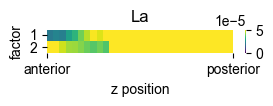

In [ ]:
sub_factors = [1,2]
#tarray = spatial_cell_count_for_subregion[rejected_factor_idx,idx,:]
tarray = spatial_cell_count_for_full[sub_factors,:]
tarray = tarray[:,~np.isnan(tarray[0,:])]


fig,axs = plt.subplots(1,1,figsize = (3,0.3))
sns.heatmap(tarray,ax = axs,cmap = 'viridis',vmin = 0,vmax= 5E-5)
axs.set_title(target_site_acronym)
axs.set_yticks(np.array(range(len(sub_factors))) + 0.5)
axs.set_yticklabels(sub_factors,rotation = 0)
axs.set_xticks([0,tarray.shape[1]])
axs.set_xticklabels(['anterior','posterior'])    
axs.set_ylabel('factor')
axs.set_xlabel('z position')
fig.savefig(os.path.join(RESULTS_DIR,f'{target_site_acronym}_factors_spatial_distribution.png'),bbox_inches='tight',dpi = 512)
fig.savefig(os.path.join(RESULTS_DIR,f'{target_site_acronym}_factors_spatial_distribution.pdf'),bbox_inches='tight',dpi = 512)

